In [1]:
import os
import shutil
os.environ['OMPI_MCA_rmaps_base_oversubscribe'] = '1'
n_threads = 96
os.environ['USE_PYGEOS'] = '0'
os.environ['PROJ_LIB'] = '/opt/conda/share/proj/'
os.environ['NUMEXPR_MAX_THREADS'] = f'{n_threads}'
os.environ['NUMEXPR_NUM_THREADS'] = f'{n_threads}'
os.environ['OMP_THREAD_LIMIT'] = f'{n_threads}'
os.environ["OMP_NUM_THREADS"] = f'{n_threads}'
os.environ["OPENBLAS_NUM_THREADS"] = f'{n_threads}' # export OPENBLAS_NUM_THREADS=4 
os.environ["MKL_NUM_THREADS"] = f'{n_threads}' # export MKL_NUM_THREADS=6
os.environ["VECLIB_MAXIMUM_THREADS"] = f'{n_threads}' # export VECLIB_MAXIMUM_THREADS=4
import gc
from datetime import datetime
from osgeo import gdal, gdal_array
from pathlib import Path
from typing import Callable, Iterator, List,        Union
import bottleneck as bn
import geopandas as gpd
import numpy as np
import pandas as pd
import skmap_bindings as sb
import tempfile
import cv2
import time
import sys
import csv
from scipy.signal import savgol_coeffs
import numpy as np
from skmap.io import process
import matplotlib.pyplot as plt
from mpi4py import MPI
import random

gdal_opts = {
 'GDAL_HTTP_VERSION': '1.0',
 'CPL_VSIL_CURL_ALLOWED_EXTENSIONS': '.tif',
}

co = ['TILED=YES', 'BIGTIFF=YES', 'COMPRESS=DEFLATE', 'BLOCKXSIZE=1024', 'BLOCKYSIZE=1024']

executor = None

def ttprint(*args, **kwargs):
    from datetime import datetime
    import sys

    print(f'[{datetime.now():%H:%M:%S}] ', end='')
    print(*args, **kwargs, flush=True)

def make_tempdir(basedir='skmap', make_subdir = True):
    tempdir = Path(TMP_DIR).joinpath(basedir)
    if make_subdir: 
        name = Path(tempfile.NamedTemporaryFile().name).name
        tempdir = tempdir.joinpath(name)
    tempdir.mkdir(parents=True, exist_ok=True)
    return tempdir

def make_tempfile(basedir='skmap', prefix='', suffix='', make_subdir = False):
    tempdir = make_tempdir(basedir, make_subdir=make_subdir)
    return tempdir.joinpath(
        Path(tempfile.NamedTemporaryFile(prefix=prefix, suffix=suffix).name).name
    )
    
def get_SWAG_weights(att_env, att_seas, season_size, n_imag):
    conv_mat_row = np.zeros((n_imag))
    base_func = np.zeros((season_size,))
    period_y = season_size/2.0
    slope_y = att_seas/10/period_y
    for i in np.arange(season_size):
        if i <= period_y:
            base_func[i] = -slope_y*i
        else:
            base_func[i] = slope_y*(i-period_y)-att_seas/10
    # Compute the envelop to attenuate temporarly far images
    env_func = np.zeros((n_imag,))
    delta_e = n_imag
    slope_e = att_env/10/delta_e
    for i in np.arange(delta_e):
        env_func[i] = -slope_e*i
        conv_mat_row = 10.0**(np.resize(base_func,n_imag) + env_func)
    return conv_mat_row    

def process_image_in_chunks(image, chunk_size, inpaint_radius, gap_th, fft_th):
    mask = np.isnan(image).astype(np.uint8)  # 1 where missing, 0 otherwise
    height, width = image.shape
    n_chunk_height = int(np.floor(height/chunk_size))
    n_chunk_width = int(np.floor(width/chunk_size))
    rand_shift_row = random.randint(0, height - chunk_size * n_chunk_height)
    rand_shift_col = random.randint(0, width - chunk_size * n_chunk_width)
    gap_fraq = np.zeros((n_chunk_height, n_chunk_width))
    fft_score = np.zeros((n_chunk_height, n_chunk_width))
    rec_flag = np.zeros((n_chunk_height, n_chunk_width))
    output_image = image.copy()
    
    # Loop through the image by chunks
    for i in range(0, n_chunk_height):
        for j in range(0, n_chunk_width):
            row_start, row_end = (i * chunk_size + rand_shift_row, (i+1) * chunk_size + rand_shift_row)
            col_start, col_end = (j * chunk_size + rand_shift_col, (j+1) * chunk_size + rand_shift_col)
            image_chunk = image[row_start:row_end, col_start:col_end]
            mask_chunk = mask[row_start:row_end, col_start:col_end]
            gap_count_chunk = np.sum(mask_chunk)
            gap_fraq[i, j] = gap_count_chunk/chunk_size/chunk_size
            # Inpaint the chunk
            if gap_fraq[i, j] < gap_th:
                image_filled = np.nan_to_num(image_chunk, nan=0)
                ft = np.fft.ifftshift(image_filled)
                ft = np.fft.fft2(ft, norm='ortho')
                ft = np.fft.fftshift(ft)
                ft[48:80,48:80] = 0
                fft_score[i, j] = np.max(np.abs(ft))
                if fft_score[i, j] > fft_th:
                    inpainted_chunk = cv2.inpaint(image_filled, mask_chunk, inpaintRadius=inpaint_radius, flags=cv2.INPAINT_TELEA)
                    output_image[row_start:row_end, col_start:col_end] = inpainted_chunk
                    rec_flag[i,j] = 1
                    
    return output_image, gap_fraq, fft_score, rec_flag
years = range(2015,2020)
x_size, y_size = (4004, 4004)
x_off, y_off = (0,0)
n_pix = x_size * y_size
no_data = 0
bands_list = [1,]
file_ending = '_go_epsg.4326_v20240521.tif'
n_imag_per_year = 23
n_imag_per_year_agg = 12
out_index_offset = 0
n_years = len(years)
n_s = n_years*n_imag_per_year
n_s_agg = n_years*n_imag_per_year_agg

backend = 'Matrix'

bands_prefix = ['red_glad',
                'nir_glad',
                'qa_mask']

qa_range = range(n_s*2, n_s*3)
nir_range = range(n_s*1, n_s*2)
red_range = range(n_s*0, n_s*1)


doy_start = ['0101', '0117', '0202', '0218', '0305', '0321', '0406', '0422', '0508', '0524', '0609',
             '0625', '0711', '0727', '0812', '0828', '0913', '0929', '1015', '1031', '1116', '1202', '1218']

doy_end = ['0116', '0201', '0217', '0304', '0320', '0405', '0421', '0507', '0523', '0608', '0624',
           '0710', '0726', '0811', '0827', '0912', '0928', '1014', '1030', '1115', '1201', '1217', '1231']


month_start = ['0101', '0201', '0301', '0401', '0501', '0601', '0701', '0801', '0901', '1001', '1101', '1201']
month_end = ['0131', '0228', '0331', '0430', '0531', '0630', '0731', '0831', '0930', '1031', '1130', '1231']


# SWA time-series reconstruction parameters
att_env, att_seas, future_scaling = (20.0, 40.0, 0.1)

# MODIS NDVI filtering parameters
diff_th = 35
count_th = int(n_s/4)

# Impainting stripes parameters
fft_th = 1e4
gap_th = 0.4
chunk_size = 128
inpaint_radius = 3

# tiles = ['009E_04N', '009E_51N', '013E_61N', '050W_07S', '085W_52N', '091W_37N', '115E_03S', '127E_42N']
# tiles =                  ['009E_51N', '013E_61N', '127E_42N', 052W_19S] # ready tiles
# respective_MODIS_tile = ['?',         'h18v02',    '?',       'h13v10'] # ready tiles
# Command to copy MODIS data "seq 2000 2023 | xargs -I {} echo "mc find gaia/tmp-mod13q1.061-tif/{}/h18v02" | bash | grep ndvi | xargs -I {} echo "mc cp {} ." | parallel -j30"
# Command to rename MODIS files "for file in MOD13Q1.*.tif; do mv "$file" "$(echo "$file" | sed 's/\.[0-9]\{13\}//')"; done"
landsat_tile = '013E_61N'
modis_tile = 'h18v02' # ready tiles

# for landsat_tile, modis_tile in zip(landsat_tiles, modis_tiles):

ttprint(f"Processing tile {landsat_tile}")

landsat_files = []
modis_files = []
for b in bands_prefix:
    for year in years:
        for m in range(n_imag_per_year):
            # landsat_files.append(f'http://192.168.49.{random.randint(30,44)}:8333/prod-landsat-ard2/{landsat_tile}/raw/{b}.ard2_m_30m_s_{year}{doy_start[m]}_{year}{doy_end[m]}{file_ending}')
            landsat_files.append(f'data_16days/{landsat_tile}/{b}.ard2_m_30m_s_{year}{doy_start[m]}_{year}{doy_end[m]}{file_ending}')
for year in years:
    if year < 2000:
        year = 2000
    for m in range(23):
        if (year == 2000) & (m < 3):
            m = 3
        if (year == 2021) & (m == 17):
            m = 16
        if (year == 2016) & (m == 22):
            m = 21
        if (year == 2022) & (m == 0):
            m = 1
        modis_files.append(f'data_16days/{modis_tile}/MOD13Q1.A{year}{str(1+16*m).zfill(3)}.{modis_tile}.061_ndvi.tif')

landsat_data = np.empty((n_s*4, n_pix), dtype=np.float32)
modis_data = np.empty((n_s, n_pix), dtype=np.float32)

start = time.time()
sb.readData(landsat_data, n_threads, landsat_files, range(len(landsat_files)), x_off, y_off, x_size, y_size, bands_list, gdal_opts, no_data, np.nan)
ttprint(f"Tile {landsat_tile} - Reading Landsat data: {(time.time() - start):.2f} segs")

start = time.time()
comm = MPI.COMM_WORLD
rank = comm.Get_rank()
size = comm.Get_size()
if size != 1:
    print("This example requires exactly one parent process.")
    comm.Abort(1)
n_proc = n_s

landsat_args = ",".join(landsat_files)
modis_args = ",".join(modis_files)
other_args = [str(n_threads), str(n_pix), "GRA_NearestNeighbour"]

# Write arguments to a temporary file
with open('args.txt', 'w') as f:
    f.write('\n'.join([landsat_args, modis_args] + other_args))
    
intercomm = MPI.COMM_SELF.Spawn(
    sys.executable, 
    args=['child.py', 'args.txt'], 
    maxprocs=n_proc
)
for i in range(n_proc):
    received_array = np.empty(n_pix, dtype=np.float32)
    intercomm.Recv(received_array, source=MPI.ANY_SOURCE, tag=i)
    modis_data[i, :] = received_array
ttprint(f"Tile {landsat_tile} - Reading MODIS data: {(time.time() - start):.2f} segs")
intercomm.Disconnect()
MPI.Finalize()


[15:52:10] Processing tile 013E_61N
[15:52:14] Tile 013E_61N - Reading Landsat data: 3.63 segs
[15:52:38] Tile 013E_61N - Reading MODIS data: 24.34 segs


In [2]:
# import zarr
# from numcodecs import blosc
# blosc.set_nthreads(96)  
# start = time.time()
# z_landsat = zarr.open('zarr_test/landsat.zarr', mode='w')
# tile = z_landsat.empty(f'{landsat_tile}',shape=landsat_data_xy.shape, chunks=(23,1024,1024), dtype='u2', synchronizer=zarr.ThreadSynchronizer())
# ttprint(f"Creating zarr file: {(time.time() - start):.2f} s")
# start = time.time()
# z_landsat[:] = landsat_data_xy[:]
# ttprint(f"Filling zarr file: {(time.time() - start):.2f} s")


In [3]:
start = time.time()

landsat_mask = np.empty((n_s, x_size * y_size), dtype=np.float32)
sb.extractArrayRows(landsat_data, n_threads, landsat_mask, qa_range)

landsat_nir = np.empty((n_s, x_size * y_size), dtype=np.float32)
sb.extractArrayRows(landsat_data, n_threads, landsat_nir, nir_range)
landsat_red = np.empty((n_s, x_size * y_size), dtype=np.float32)
sb.extractArrayRows(landsat_data, n_threads, landsat_red, red_range)

# 14 = additional cloud buffer over land
# 3 = cloud
#                0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17   
snow_buffer   = [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

for k in range(0,18):
    sb.swapRowsValues(landsat_mask, n_threads, range(n_s), k, snow_buffer[k])
sb.maskNan(landsat_mask, n_threads, range(n_s), 0.)
snow_mask = (landsat_mask == 1.)
snow_nir = landsat_nir[snow_mask] 
ttprint(f"Tile {landsat_tile} - Masking data: {(time.time() - start):.2f} segs")


[15:52:47] Tile 013E_61N - Masking data: 3.72 segs


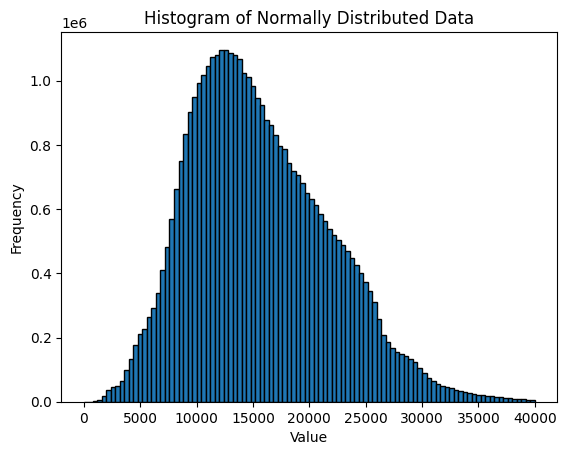

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Generate some data using NumPy

# Step 2: Create the histogram
plt.hist(snow_nir, bins=100, edgecolor='black')

# Step 3: Add labels and title
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of Normally Distributed Data')

# Step 4: Show the plot
plt.show()


In [28]:
snow_nir

array([22282., 22282., 22282., ...,  3373.,  3081.,  3081.], dtype=float32)

In [27]:
snow_nir.size

40285058

In [26]:
snow_nir = landsat_nir[landsat_mask == 1.] 

In [24]:
np.count_nonzero(landsat_mask)

40285058

In [21]:
np.count_nonzero(landsat_mask)/landsat_mask.size

0.021850330749040733

In [20]:
landsat_mask

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

Year 2015


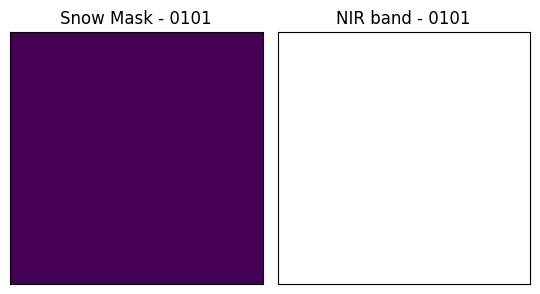

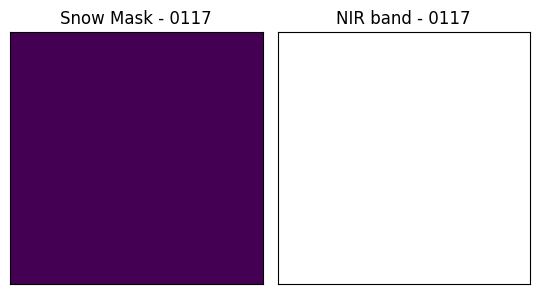

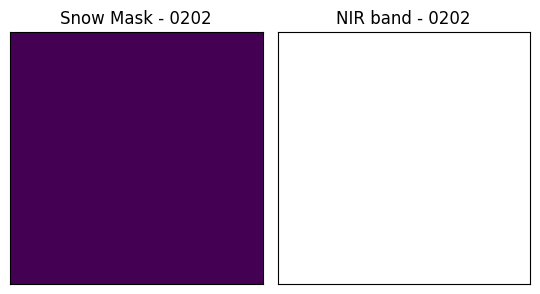

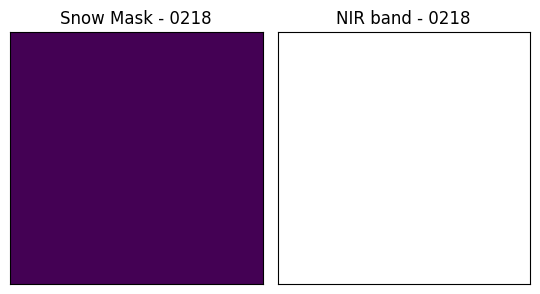

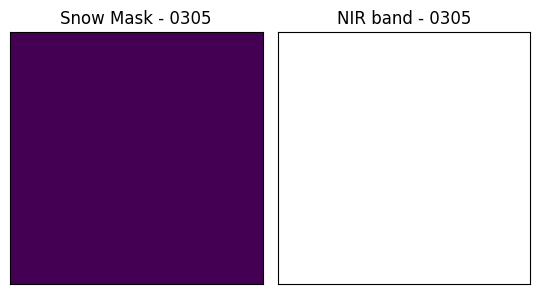

...

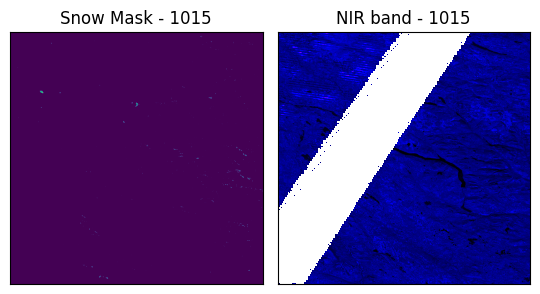

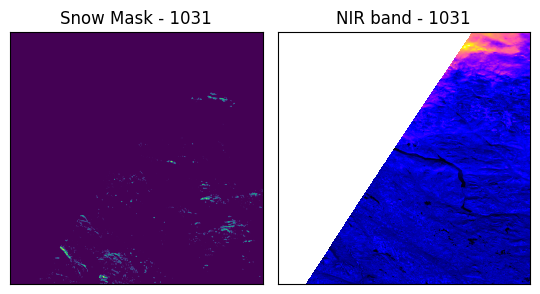

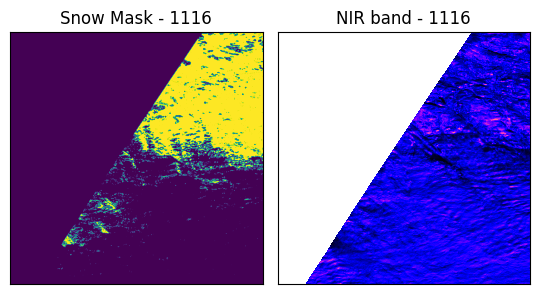

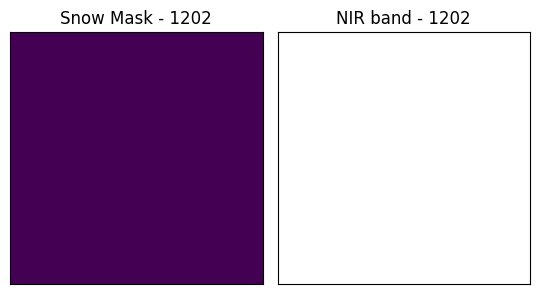

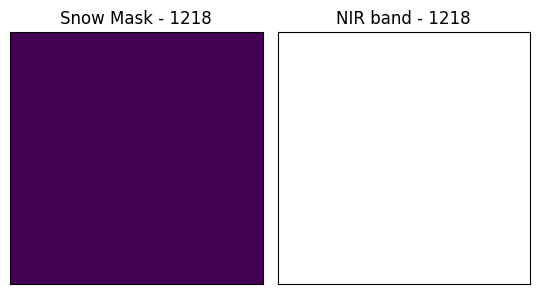

Year 2016


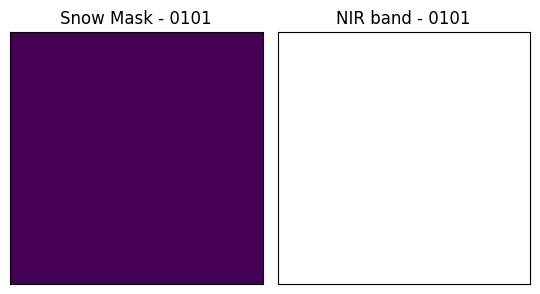

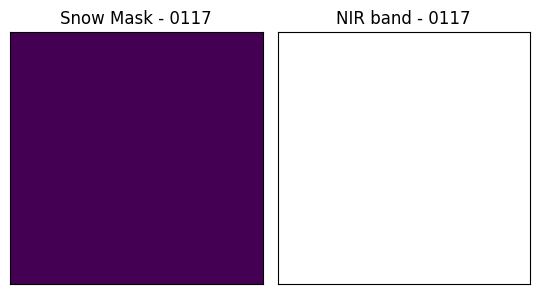

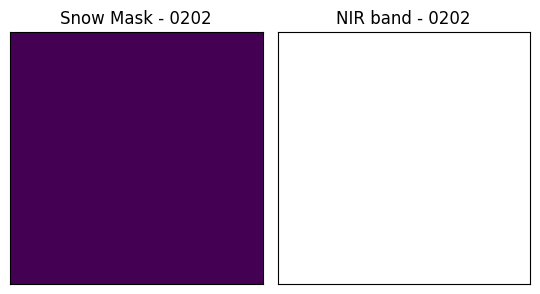

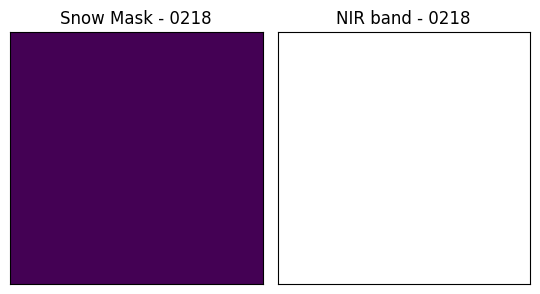

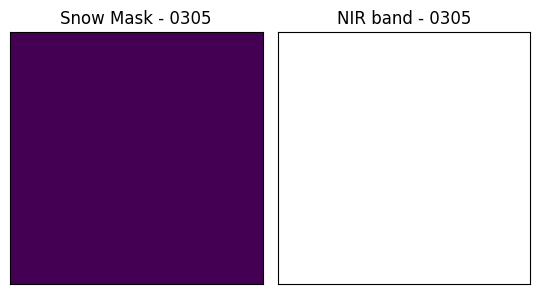

...

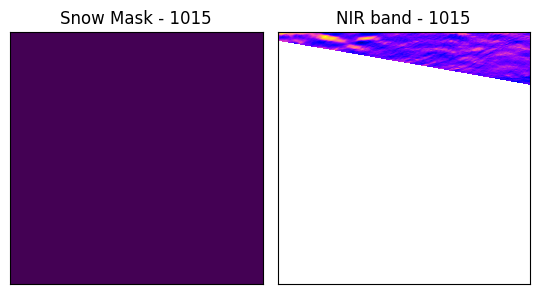

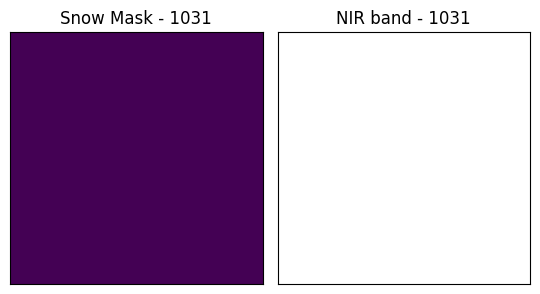

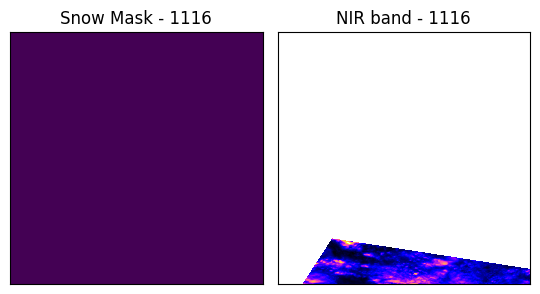

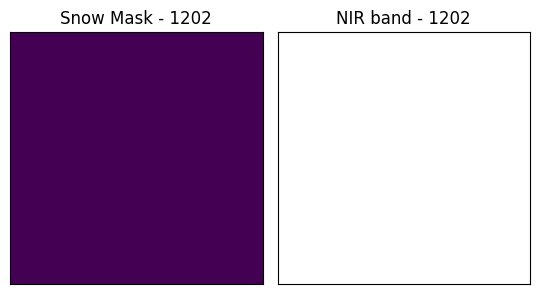

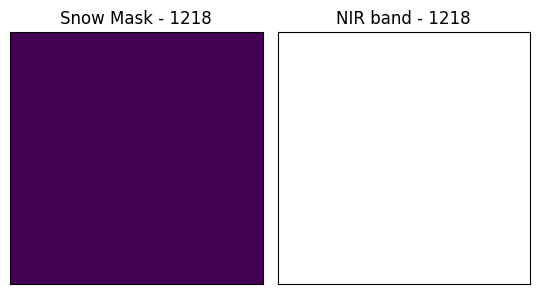

Year 2017


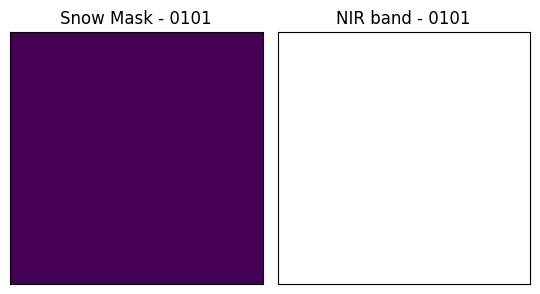

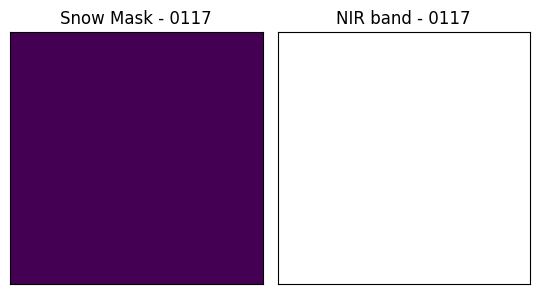

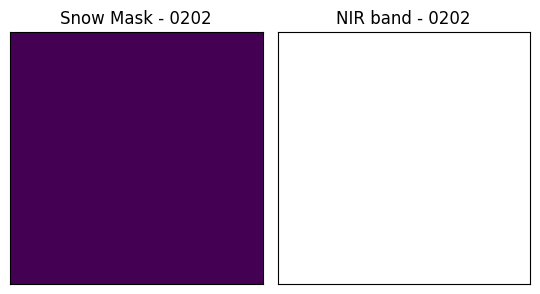

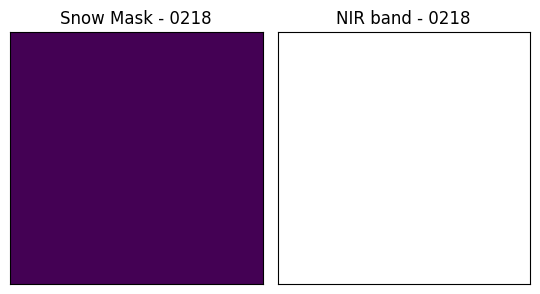

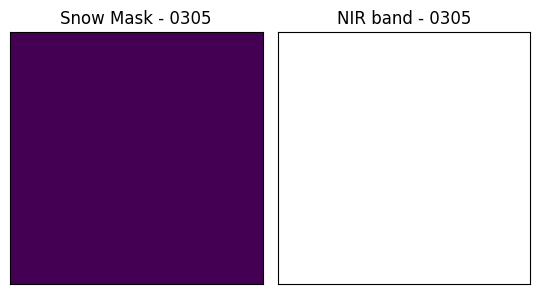

...

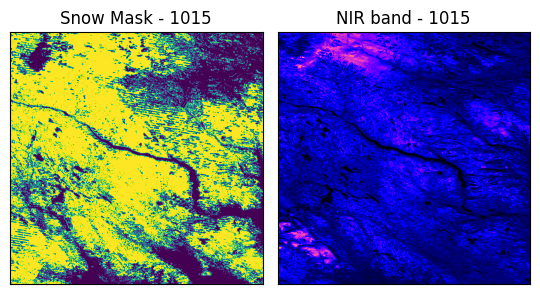

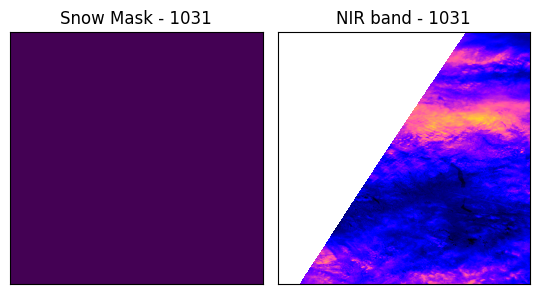

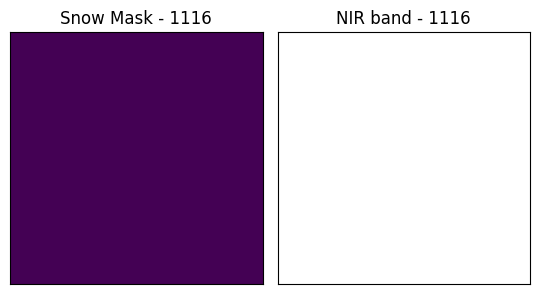

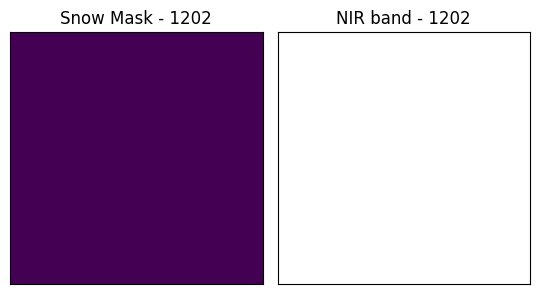

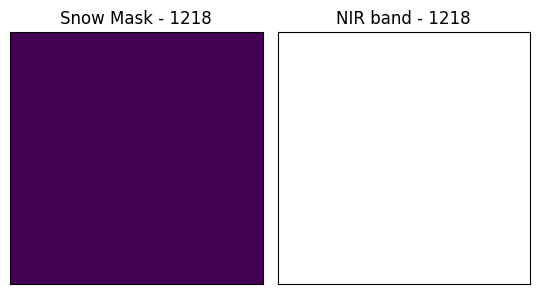

Year 2018


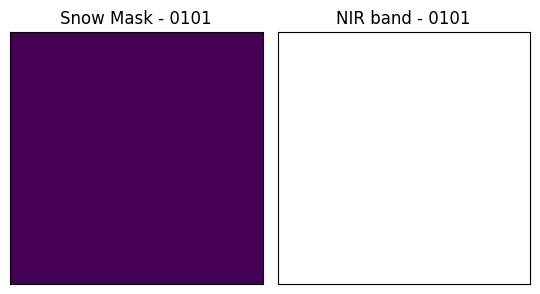

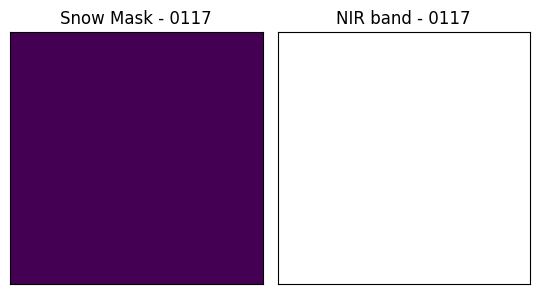

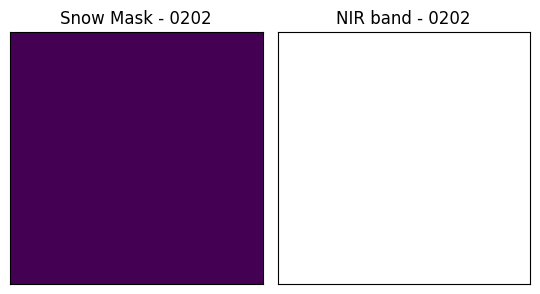

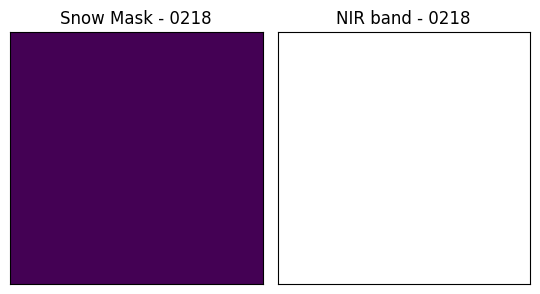

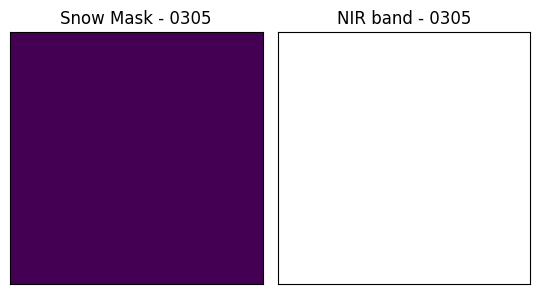

...

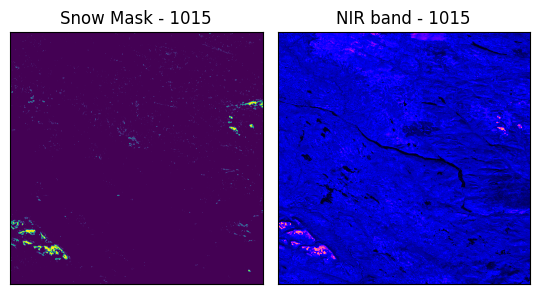

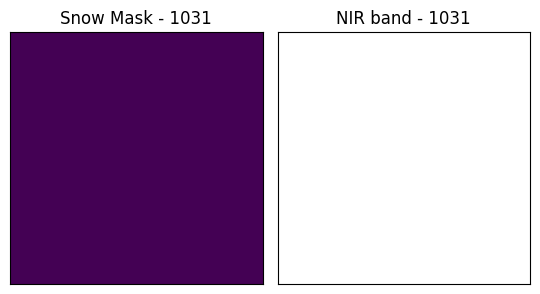

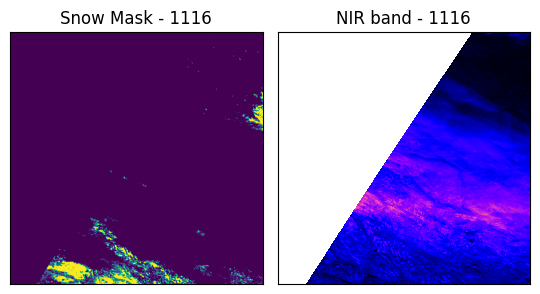

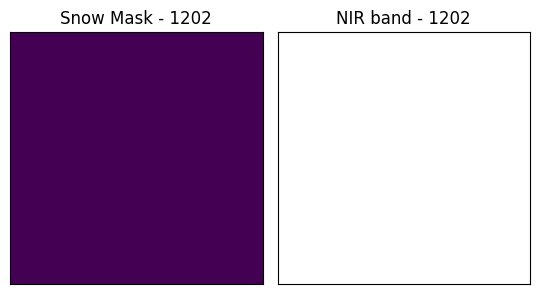

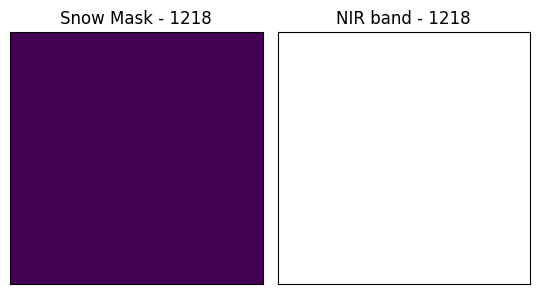

Year 2019


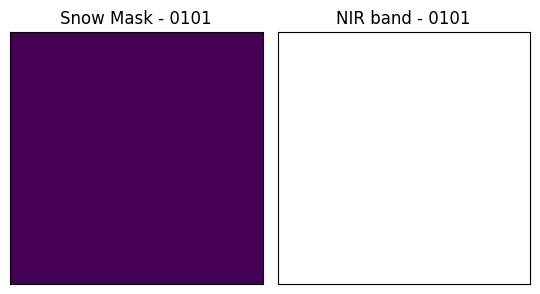

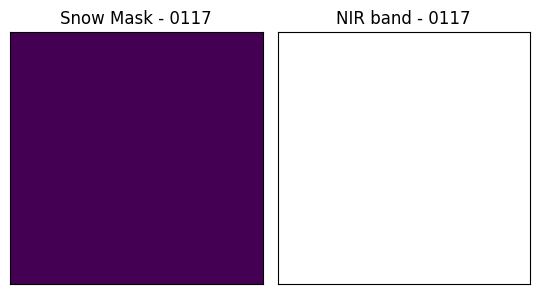

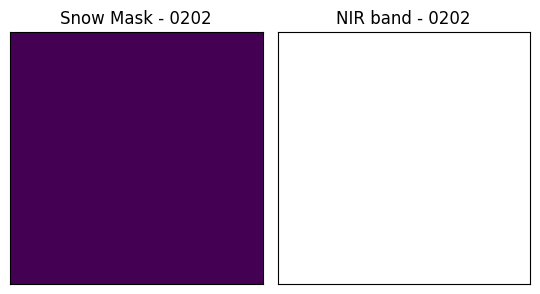

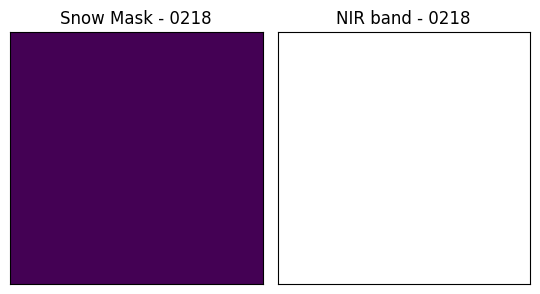

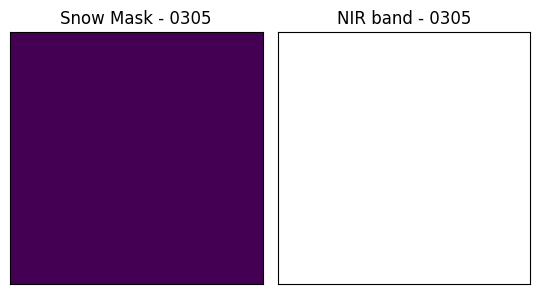

...

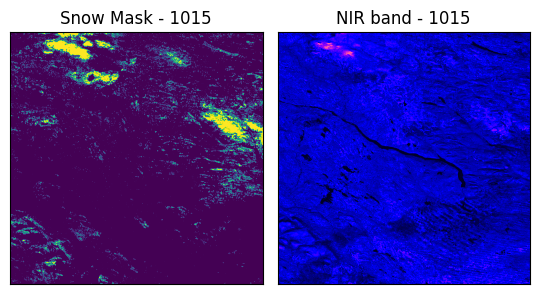

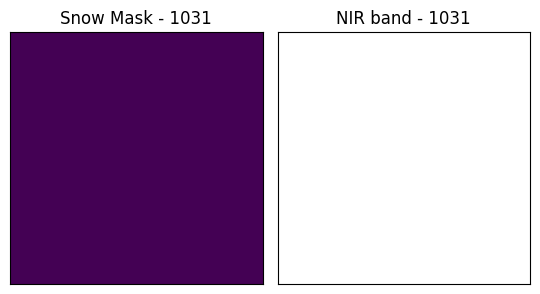

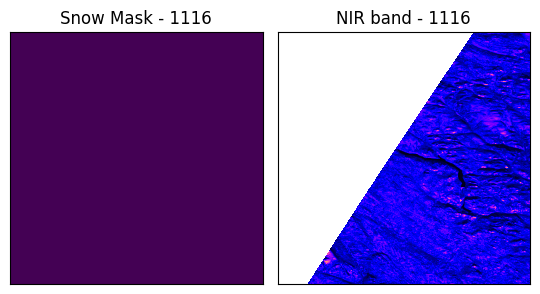

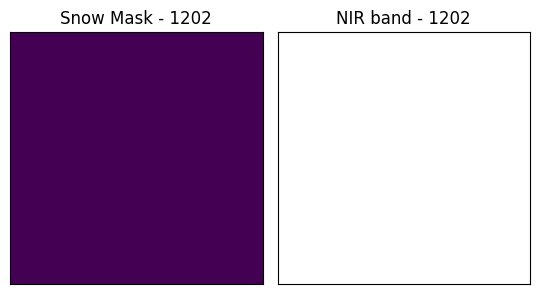

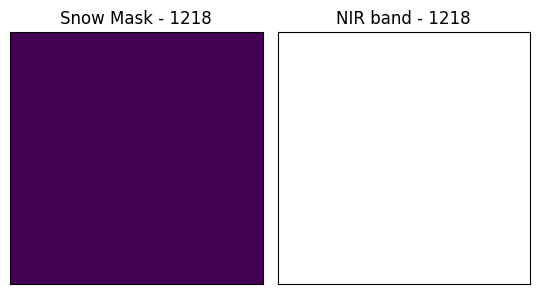

In [23]:
landsat_mask_plt = landsat_mask.reshape(landsat_mask.shape[0], x_size, y_size)
landsat_nir_plt = landsat_nir.reshape(landsat_nir.shape[0], x_size, y_size)

var_names = ("Snow Mask","NIR band",) #, "Landsat rec. NDVI", "Landsat filt. rec. NDVI", "Landsat filt. NDVI")
time_frames = range(n_imag_per_year*0, n_imag_per_year*5)


for i, idx in enumerate(time_frames):
    if (idx % n_imag_per_year) == 0:
        print(f"Year {years[int(idx/n_imag_per_year)]}")
    fig, axes = plt.subplots(1, len(var_names), figsize=(2*len(var_names)+1.5, 4))
    axes[0].imshow(landsat_mask_plt[idx])
    axes[0].set_title(f"{var_names[0]} - {doy_start[idx%n_imag_per_year]}")
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    axes[1].imshow(landsat_nir_plt[idx], cmap='gnuplot2')
    axes[1].set_title(f"{var_names[1]} - {doy_start[idx%n_imag_per_year]}")
    axes[1].set_xticks([])
    axes[1].set_yticks([])

    plt.tight_layout()
    plt.show()

# fig.savefig(f'{tile}_NDVI_{year}.png', bbox_inches='tight')

